In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# LIBRIES
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# LOAD DATASET FROM KAGGLE

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [4]:
# DOWNLOAD DATA FROM KAGGLE
!kaggle datasets download -d jangedoo/utkface-new

Dataset URL: https://www.kaggle.com/datasets/jangedoo/utkface-new
License(s): copyright-authors
 98% 324M/331M [00:00<00:00, 588MB/s]
100% 331M/331M [00:00<00:00, 605MB/s]


In [5]:
# UNZIP THE DATA
import zipfile
zip = zipfile.ZipFile("/content/utkface-new.zip",'r')
zip.extractall("/content")
zip.close()

# PREPARE THE DATA

In [6]:
# EXTRACT LABELS AND IMGS_PATH FROM IMGS_FILE_NAME
imgs_path = '/content/utkface_aligned_cropped/UTKFace'
ages = []
genders = []
imgs = []
for filename in os.listdir(imgs_path):
  age = filename.split('_')[0]
  gender = filename.split('_')[1]
  img_path = filename
  ages.append(int(age))
  genders.append(int(gender))
  imgs.append(img_path)

# STORE IT IN DATAFRAME
df = pd.DataFrame({'age':ages,'gender':genders,'img':imgs})

In [7]:
df['age'] = df['age'].astype('float32')
df['gender'] = df['gender'].astype('float32')

In [8]:
df.head()

,age,gender,img
0,62.0,1.0,62_1_0_20170110183746742.jpg.chip.jpg
1,21.0,0.0,21_0_4_20161223214825003.jpg.chip.jpg
2,2.0,1.0,2_1_2_20161219212324493.jpg.chip.jpg
3,61.0,0.0,61_0_2_20170112224332508.jpg.chip.jpg
4,42.0,0.0,42_0_0_20170104183950934.jpg.chip.jpg


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23708 entries, 0 to 23707
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   age     23708 non-null  float32
 1   gender  23708 non-null  float32
 2   img     23708 non-null  object 
dtypes: float32(2), object(1)
memory usage: 370.6+ KB


In [10]:
df.shape

(23708, 3)

In [11]:
# SHUFFLE THE DATA
df  = df.sample(frac=1,random_state=0)

In [12]:
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(df, test_size=0.25, random_state=42)
test_df,val_df = train_test_split(temp_df, test_size=0.2, random_state=42)

In [13]:
# SHAPES
train_df.shape,test_df.shape,val_df.shape

((17781, 3), (4741, 3), (1186, 3))

In [14]:
print("Train gender dist:", train_df['gender'].value_counts(normalize=True))
print("Val gender dist:", val_df['gender'].value_counts(normalize=True))
print("Test gender dist:", test_df['gender'].value_counts(normalize=True))

Train gender dist: gender
0.0    0.520331
1.0    0.479669
Name: proportion, dtype: float64
Val gender dist: gender
0.0    0.542159
1.0    0.457841
Name: proportion, dtype: float64
Test gender dist: gender
0.0    0.526471
1.0    0.473529
Name: proportion, dtype: float64


In [15]:
print("Train Age Mean : ",train_df['age'].mean())
print("Train Age Mean : ",test_df['age'].mean())
print("Train Age Mean : ",val_df['age'].mean())

Train Age Mean :  33.298294
Train Age Mean :  33.337482
Train Age Mean :  33.24536


# LOAD DATA

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [24]:
# APPLY PREPROCESSING ON IMGS
train_data_gen = ImageDataGenerator(
    rescale = 1/255
)
test_data_gen = ImageDataGenerator(
    rescale = 1/255
)
val_data_gen = ImageDataGenerator(
    rescale = 1/255
)

In [25]:
def custom_gen(generator):
    while True:
        x, y = next(generator)
        yield x, {'age': y[:, 0].astype('float32'), 'gender': y[:, 1].astype('float32')}

In [26]:
# LOAD IMGS USING DATAFRAME
train_gen_base = train_data_gen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    batch_size=32,
    class_mode='raw'
)
test_gen_base = test_data_gen.flow_from_dataframe(
    dataframe=test_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    class_mode='raw'
)
val_gen_base = val_data_gen.flow_from_dataframe(
    dataframe=val_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    class_mode='raw'
)

train_gen = custom_gen(train_gen_base)
test_gen = custom_gen(test_gen_base)
val_gen = custom_gen(val_gen_base)

Found 17781 validated image filenames.
Found 4741 validated image filenames.
Found 1186 validated image filenames.


In [27]:
# Check a batch from the generator
x, y = next(train_gen)
print(type(y))                 # should be dict
print(y['age'].dtype)         # should be float32
print(y['gender'].dtype)

<class 'dict'>
float32
float32


# MODEL BUILDING

### We are using VGG16 with fine-tuning, enabling all layers after block 5 for training. Additionally, we are using three fully connected layers with 256, 128, and 64 nodes, respectively

In [17]:
from keras.applications.vgg16 import VGG16
from keras.layers import *
from keras.models import Model

In [ ]:
conv_base = VGG16(weights='imagenet',
      include_top=False,
      input_shape=(150,150,3))

In [ ]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False
  print(layer.name,layer.trainable)

input_layer_1 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_pool True


In [ ]:
# CREATE LAYERS
output = conv_base.layers[-1].output
batch_norm = BatchNormalization()(output)
flatten = Flatten()(batch_norm)

dense1 = Dense(256,activation='relu')(flatten)
dense2 = Dense(256,activation='relu')(flatten)

dense3 = Dense(128,activation='relu')(dense1)
dense4 = Dense(128,activation='relu')(dense2)

dense5 = Dense(64,activation='relu')(dense3)
dense6 = Dense(64,activation='relu')(dense4)

output1 = Dense(1,activation='linear',name='age')(dense5)
output2 = Dense(1,activation='sigmoid',name='gender')(dense6)

In [ ]:
# CREATE MODEL
model = Model(inputs=conv_base.input,outputs=[output1,output2])

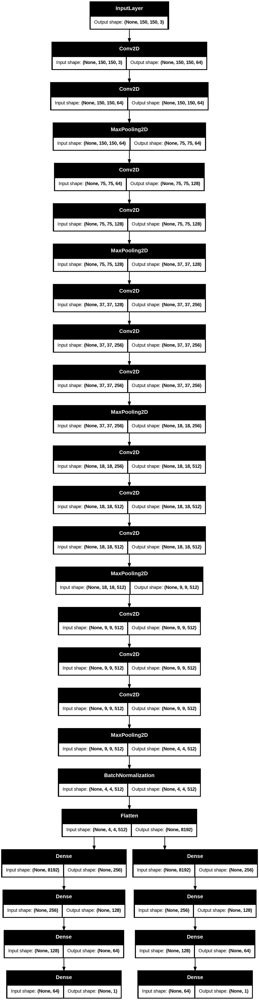

In [ ]:
from keras.utils import plot_model
plot_model(model,show_shapes=True)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 150, 150,  │      1,792 │ input_layer_1[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 150, 150,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 75, 75,    │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 75, 75,    │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 75, 75,    │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 37, 37,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 37, 37,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 37, 37,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 37, 37,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 18, 18,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 18, 18,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 18, 18,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 18, 18,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 9, 9, 512) │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 9, 9, 512) │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 9, 9, 512) │  2,359,808 │ block5_conv1[0][

 Total params: 18,993,986 (72.46 MB)

 Trainable params: 11,357,698 (43.33 MB)

 Non-trainable params: 7,636,288 (29.13 MB)

In [ ]:
# COMPILE THE MODEL
model.compile(
    optimizer='adam',
    loss={
        'age': 'mae',             # or use model.output_names[0]
        'gender': 'binary_crossentropy'
    },
    metrics={
        'age': 'mae',
        'gender': 'accuracy'
    },
    loss_weights={'age': 1.0, 'gender': 99.0}
)

In [ ]:
# APPLY EARLYSTOPPING ON VAL_GENDER
from keras.callbacks import EarlyStopping
early_stop = EarlyStopping(
    monitor='val_gender_loss',
    patience=5,
    verbose=1,
    restore_best_weights=True,
    min_delta=0.001,mode='min'
)

In [ ]:
# TRAIN THE MODEL
history = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen_base),
    validation_data=val_gen,
    validation_steps=len(val_gen_base),
    epochs=20,
    callbacks=early_stop
)

Epoch 1/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 76s 136ms/step - age_loss: 7.5749 - age_mae: 7.5749 - gender_accuracy: 0.8985 - gender_loss: 0.2388 - loss: 31.2150 - val_age_loss: 7.1335 - val_age_mae: 7.2412 - val_gender_accuracy: 0.8836 - val_gender_loss: 0.2322 - val_loss: 30.6665
Epoch 2/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 82s 147ms/step - age_loss: 6.9858 - age_mae: 6.9858 - gender_accuracy: 0.9152 - gender_loss: 0.2004 - loss: 26.8207 - val_age_loss: 6.7807 - val_age_mae: 6.7807 - val_gender_accuracy: 0.8824 - val_gender_loss: 0.2489 - val_loss: 31.4232
Epoch 3/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 82s 147ms/step - age_loss: 6.5452 - age_mae: 6.5452 - gender_accuracy: 0.9265 - gender_loss: 0.1741 - loss: 23.7769 - val_age_loss: 6.6833 - val_age_mae: 6.6833 - val_gender_accuracy: 0.9054 - val_gender_loss: 0.2384 - val_loss: 30.2870
Epoch 4/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 82s 147ms/step - age_loss: 6.4539 - age_mae: 6.4539 - gender_accuracy: 0.9437 - gender_loss: 0.1421 - loss: 20.5190 - val_age_los

# TRACKING RESULTS
1. VAL_MAE = 7.33 VAL_GENDER_ACCURACY = 90, VAL_GENDER_LOSS=0.30
2. VAL_MAE = 6.7  VAL_GNEDER_ACCURACY = 91.1 VAL_GENDER_LOSS=0.20

In [ ]:
# EXP 1

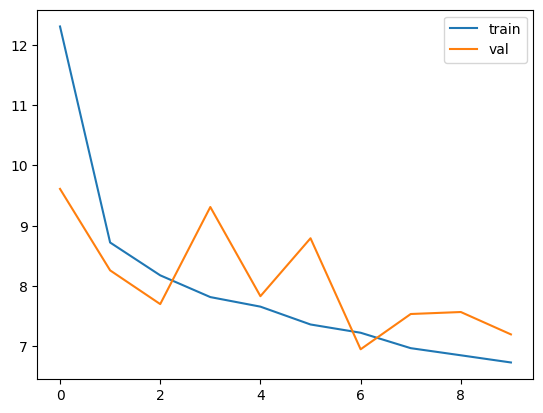

In [ ]:
plt.plot(history.history['age_loss'])
plt.plot(history.history['val_age_loss'])
plt.legend(['train','val'])
plt.show()

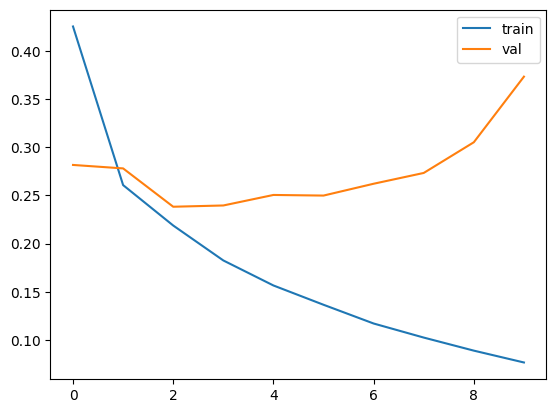

In [ ]:
plt.plot(history.history['gender_loss'])
plt.plot(history.history['val_gender_loss'])
plt.legend(['train','val'])
plt.show()

In [ ]:
# EXP 2

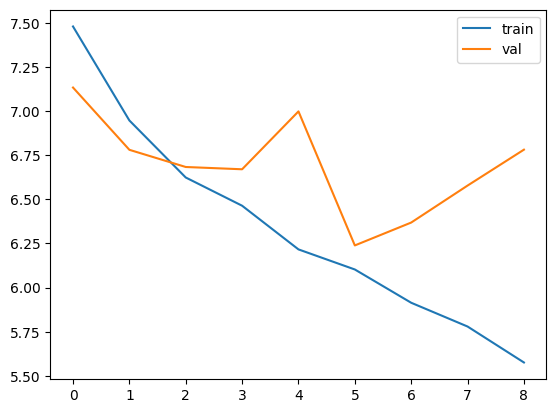

In [ ]:
plt.plot(history.history['age_loss'])
plt.plot(history.history['val_age_loss'])
plt.legend(['train','val'])
plt.show()

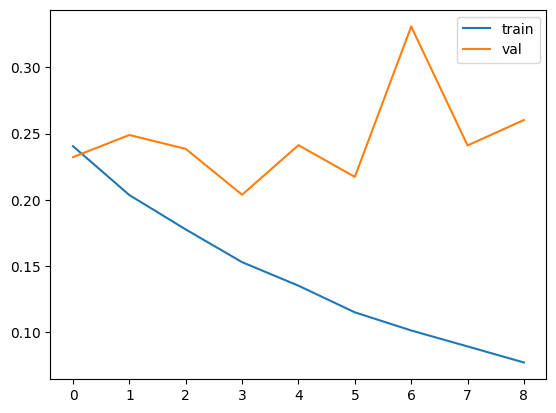

In [ ]:
plt.plot(history.history['gender_loss'])
plt.plot(history.history['val_gender_loss'])
plt.legend(['train','val'])
plt.show()

### OVERFITTING IN GENDER CLASSIFICATION

# LET'S TRY DATAAUGMENTATION FOR REDUCE OVERFITTING

In [ ]:
# APPLY PREPROCESSING ON IMGS
train_data_gen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)
test_data_gen = ImageDataGenerator(
    rescale = 1/255
)
val_data_gen = ImageDataGenerator(
    rescale = 1/255
)

In [ ]:
def custom_gen(generator):
    while True:
        x, y = next(generator)
        yield x, {'age': y[:, 0].astype('float32'), 'gender': y[:, 1].astype('float32')}

In [ ]:
# LOAD IMGS USING DATAFRAME
train_gen_base = train_data_gen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    batch_size=32,
    class_mode='raw'
)
test_gen_base = test_data_gen.flow_from_dataframe(
    dataframe=test_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    class_mode='raw'
)
val_gen_base = val_data_gen.flow_from_dataframe(
    dataframe=val_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    class_mode='raw'
)

train_gen = custom_gen(train_gen_base)
test_gen = custom_gen(test_gen_base)
val_gen = custom_gen(val_gen_base)

Found 17781 validated image filenames.
Found 4741 validated image filenames.
Found 1186 validated image filenames.


In [ ]:
conv_base = VGG16(weights='imagenet',
      include_top=False,
      input_shape=(150,150,3))

In [ ]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False
  print(layer.name,layer.trainable)

input_layer_2 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_pool True


In [ ]:
# CREATE LAYERS
output = conv_base.layers[-1].output
batch_norm = BatchNormalization()(output)
flatten = Flatten()(batch_norm)

dense1 = Dense(256,activation='relu')(flatten)
dense2 = Dense(256,activation='relu')(flatten)

dense3 = Dense(128,activation='relu')(dense1)
dense4 = Dense(128,activation='relu')(dense2)

dense5 = Dense(64,activation='relu')(dense3)
dense6 = Dense(64,activation='relu')(dense4)

dense7 = Dense(64,activation='relu')(dense5)
dense8 = Dense(64,activation='relu')(dense6)

output1 = Dense(1,activation='linear',name='age')(dense7)
output2 = Dense(1,activation='sigmoid',name='gender')(dense8)

In [ ]:
# CREATE MODEL
model = Model(inputs=conv_base.input,outputs=[output1,output2])

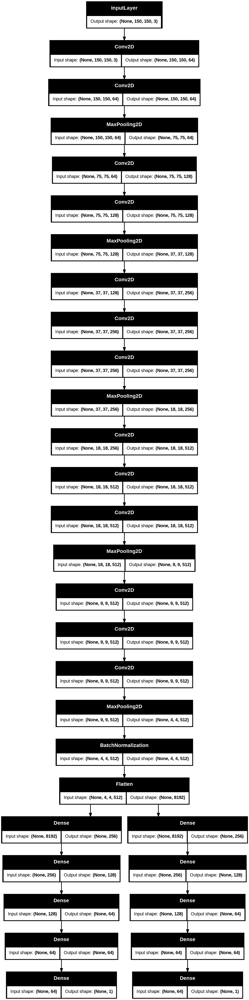

In [ ]:
from keras.utils import plot_model
plot_model(model,show_shapes=True)

In [ ]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 150, 150,  │      1,792 │ input_layer_2[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 150, 150,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 75, 75,    │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 75, 75,    │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 75, 75,    │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 37, 37,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 37, 37,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 37, 37,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 37, 37,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 18, 18,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 18, 18,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 18, 18,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 18, 18,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 9, 9, 512) │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 9, 9, 512) │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 9, 9, 512) │  2,359,808 │ block5_conv1[0][

 Total params: 19,002,306 (72.49 MB)

 Trainable params: 11,366,018 (43.36 MB)

 Non-trainable params: 7,636,288 (29.13 MB)

In [ ]:
# COMPILE THE MODEL
model.compile(
    optimizer='adam',
    loss={
        'age': 'mae',             # or use model.output_names[0]
        'gender': 'binary_crossentropy'
    },
    metrics={
        'age': 'mae',
        'gender': 'accuracy'
    },
    loss_weights={'age': 1.0, 'gender': 99.0}
)

In [ ]:
# APPLY EARLYSTOPPING ON VAL_GENDER
from keras.callbacks import EarlyStopping
early_stop = EarlyStopping(
    monitor='val_gender_loss',
    patience=5,
    verbose=1,
    restore_best_weights=True,
    min_delta=0.001,mode='min'
)

In [ ]:
# TRAIN THE MODEL
history = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen_base),
    validation_data=val_gen,
    validation_steps=len(val_gen_base),
    epochs=20,
    callbacks=early_stop
)

Epoch 1/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 145s 247ms/step - age_loss: 13.4926 - age_mae: 13.4926 - gender_accuracy: 0.7516 - gender_loss: 0.5000 - loss: 62.9919 - val_age_loss: 8.9730 - val_age_mae: 9.0181 - val_gender_accuracy: 0.8862 - val_gender_loss: 0.2544 - val_loss: 34.6876
Epoch 2/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 141s 253ms/step - age_loss: 9.0656 - age_mae: 9.0656 - gender_accuracy: 0.8506 - gender_loss: 0.3319 - loss: 41.9282 - val_age_loss: 9.6662 - val_age_mae: 9.6662 - val_gender_accuracy: 0.8956 - val_gender_loss: 0.2469 - val_loss: 34.1106
Epoch 3/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 135s 242ms/step - age_loss: 8.1788 - age_mae: 8.1788 - gender_accuracy: 0.8736 - gender_loss: 0.2889 - loss: 36.7825 - val_age_loss: 7.8415 - val_age_mae: 7.8415 - val_gender_accuracy: 0.9062 - val_gender_loss: 0.2131 - val_loss: 28.9359
Epoch 4/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 142s 255ms/step - age_loss: 8.0569 - age_mae: 8.0569 - gender_accuracy: 0.8833 - gender_loss: 0.2708 - loss: 34.8708 - val_a

In [ ]:
plt.plot(history.history['age_loss'])
plt.plot(history.history['val_age_loss'])
plt.legend(['train','val'])
plt.show()

In [ ]:
plt.plot(history.history['gender_loss'])
plt.plot(history.history['val_gender_loss'])
plt.legend(['train','val'])
plt.show()

# Now, let's try using class weights as 1:60.

In [ ]:
# APPLY PREPROCESSING ON IMGS
train_data_gen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)
test_data_gen = ImageDataGenerator(
    rescale = 1/255
)
val_data_gen = ImageDataGenerator(
    rescale = 1/255
)

In [ ]:
def custom_gen(generator):
    while True:
        x, y = next(generator)
        yield x, {'age': y[:, 0].astype('float32'), 'gender': y[:, 1].astype('float32')}

In [ ]:
# LOAD IMGS USING DATAFRAME
train_gen_base = train_data_gen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    batch_size=32,
    class_mode='raw'
)
test_gen_base = test_data_gen.flow_from_dataframe(
    dataframe=test_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    class_mode='raw'
)
val_gen_base = val_data_gen.flow_from_dataframe(
    dataframe=val_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    class_mode='raw'
)

train_gen = custom_gen(train_gen_base)
test_gen = custom_gen(test_gen_base)
val_gen = custom_gen(val_gen_base)

Found 17781 validated image filenames.
Found 4741 validated image filenames.
Found 1186 validated image filenames.


In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.applications.vgg16 import VGG16
from keras.layers import *
from keras.models import *

In [ ]:
conv_base = VGG16(weights='imagenet',
      include_top=False,
      input_shape=(150,150,3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False
  print(layer.name,layer.trainable)

input_layer False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_pool True


In [ ]:
# CREATE LAYERS
output = conv_base.layers[-1].output
batch_norm = BatchNormalization()(output)
flatten = Flatten()(batch_norm)

dense1 = Dense(256,activation='relu')(flatten)
dense2 = Dense(256,activation='relu')(flatten)

dense3 = Dense(128,activation='relu')(dense1)
dense4 = Dense(128,activation='relu')(dense2)

dense5 = Dense(64,activation='relu')(dense3)
dense6 = Dense(64,activation='relu')(dense4)

dense7 = Dense(64,activation='relu')(dense5)
dense8 = Dense(64,activation='relu')(dense6)

output1 = Dense(1,activation='linear',name='age')(dense7)
output2 = Dense(1,activation='sigmoid',name='gender')(dense8)

In [ ]:
# CREATE MODEL
model = Model(inputs=conv_base.input,outputs=[output1,output2])

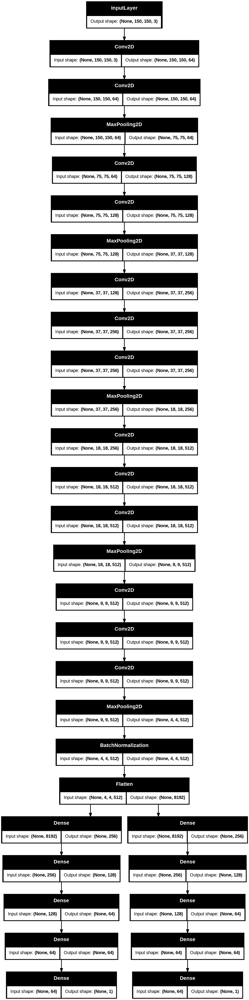

In [ ]:
from keras.utils import plot_model
plot_model(model,show_shapes=True)

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 150, 150,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 150, 150,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 75, 75,    │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 75, 75,    │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 75, 75,    │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 37, 37,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 37, 37,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 37, 37,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 37, 37,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 18, 18,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 18, 18,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 18, 18,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 18, 18,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 9, 9, 512) │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 9, 9, 512) │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 9, 9, 512) │  2,359,808 │ block5_conv1[0][

 Total params: 19,002,306 (72.49 MB)

 Trainable params: 11,366,018 (43.36 MB)

 Non-trainable params: 7,636,288 (29.13 MB)

In [ ]:
# COMPILE THE MODEL
model.compile(
    optimizer='adam',
    loss={
        'age': 'mae',             # or use model.output_names[0]
        'gender': 'binary_crossentropy'
    },
    metrics={
        'age': 'mae',
        'gender': 'accuracy'
    },
    loss_weights={'age': 1.0, 'gender': 60.0}
)

In [ ]:
# TRAIN THE MODEL
history = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen_base),
    validation_data=val_gen,
    validation_steps=len(val_gen_base),
    epochs=20,

)

Epoch 1/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 164s 268ms/step - age_loss: 12.9938 - age_mae: 12.9938 - gender_accuracy: 0.7606 - gender_loss: 0.4887 - loss: 42.3173 - val_age_loss: 8.5090 - val_age_mae: 8.5067 - val_gender_accuracy: 0.8617 - val_gender_loss: 0.2828 - val_loss: 25.8170
Epoch 2/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 139s 251ms/step - age_loss: 8.7513 - age_mae: 8.7513 - gender_accuracy: 0.8483 - gender_loss: 0.3335 - loss: 28.7636 - val_age_loss: 7.6683 - val_age_mae: 7.6683 - val_gender_accuracy: 0.7952 - val_gender_loss: 0.5059 - val_loss: 38.0251
Epoch 3/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 138s 249ms/step - age_loss: 8.0734 - age_mae: 8.0734 - gender_accuracy: 0.8662 - gender_loss: 0.2990 - loss: 26.0126 - val_age_loss: 8.0845 - val_age_mae: 8.0845 - val_gender_accuracy: 0.9005 - val_gender_loss: 0.2149 - val_loss: 20.9814
Epoch 4/20
556/556 ━━━━━━━━━━━━━━━━━━━━ 142s 255ms/step - age_loss: 7.8615 - age_mae: 7.8615 - gender_accuracy: 0.8830 - gender_loss: 0.2731 - loss: 24.2502 - val_a

In [ ]:
# SAVE THE MODEL
model.save('/content/drive/MyDrive/best_model170.keras')

# LOAD THE MODEL AND TEST ON VALIDITION

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/best_model170.keras')

In [ ]:
imgs , labels = next(val_gen)

In [ ]:
age_preds , gender_preds = model.predict(imgs)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


In [ ]:
gender_preds_decoded = [1 if g>0.5 else 0 for g in gender_preds ]

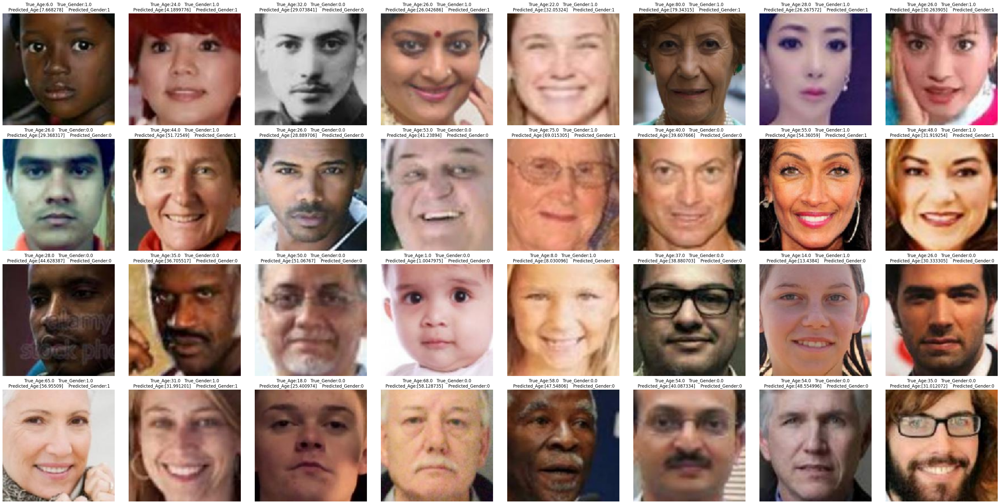

In [ ]:
plt.figure(figsize=(40, 20))
for i in range(32):
  img = imgs[i]
  age_true = labels['age'][i]
  gender_true = labels['gender'][i]
  age_pred = age_preds[i]
  gender_pred = gender_preds_decoded[i]
  # plt.figure(figsize=(10,10))
  plt.subplot(4,8,i+1)

  plt.imshow(img)
  plt.title(f"True_Age:{age_true}   True_Gender:{gender_true}\n Predicted_Age:{age_pred}    Predicted_Gender:{gender_pred}")
  plt.axis('off')
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


<ipython-input-71-22dc86bb87cc>:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pred_age = round(float(pred_age),2)


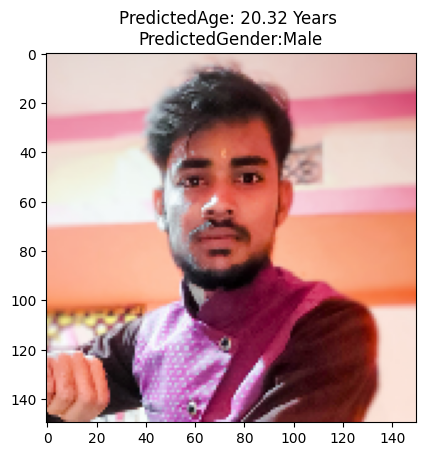

In [ ]:
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np

def CheckAgeGender(img_path):

  img = load_img(img_path, target_size=(150, 150))  # Resize
  img_array = img_to_array(img)
  img_array = img_array / 255.0
  img_array_single = np.expand_dims(img_array, axis=0)
  pred_age,pred_gender = model.predict(img_array_single)
  pred_age = round(float(pred_age),2)
  pred_gender = np.where(pred_age>0.5,'Male','Female')
  plt.imshow(img_array)
  plt.title(f"PredictedAge: {pred_age} Years \nPredictedGender:{pred_gender}")
  plt.show()

CheckAgeGender('/content/myimg.png')

# We need to improve the age MAE, so let's try again

---



# This time, we are using VGG19 and enabling all layers after block 5. We are also using four fully connected layers with 512, 256, 128, and 64 nodes, respectively

In [17]:
# APPLY PREPROCESSING ON IMGS
train_data_gen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)
test_data_gen = ImageDataGenerator(
    rescale = 1/255
)
val_data_gen = ImageDataGenerator(
    rescale = 1/255
)

In [18]:
def custom_gen(generator):
    while True:
        x, y = next(generator)
        yield x, {'age': y[:, 0].astype('float32'), 'gender': y[:, 1].astype('float32')}

In [19]:
# LOAD IMGS USING DATAFRAME
train_gen_base = train_data_gen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    batch_size=32,
    class_mode='raw'
)
test_gen_base = test_data_gen.flow_from_dataframe(
    dataframe=test_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    batch_size=32,
    class_mode='raw'
)
val_gen_base = val_data_gen.flow_from_dataframe(
    dataframe=val_df,
    directory='/content/utkface_aligned_cropped/UTKFace',
    x_col='img',
    y_col=['age','gender'],
    target_size=(150,150),
    batch_size=32,
    class_mode='raw'
)

train_gen = custom_gen(train_gen_base)
test_gen = custom_gen(test_gen_base)
val_gen = custom_gen(val_gen_base)

Found 17781 validated image filenames.
Found 4741 validated image filenames.
Found 1186 validated image filenames.


In [20]:
import tensorflow as tf
from tensorflow import keras
from keras.applications.vgg19 import VGG19
from keras.layers import *
from keras.models import *

In [ ]:
conv_base = VGG19(weights='imagenet',
      include_top=False,
      input_shape=(150,150,3))

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
conv_base.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False
  print(layer.name,layer.trainable)

input_layer False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_conv4 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_conv4 False
block4_pool False
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_conv4 True
block5_pool True


In [ ]:
# CREATE LAYERS
output = conv_base.layers[-1].output
batch_norm = BatchNormalization()(output)
flatten = Flatten()(batch_norm)

dense11 = Dense(512,activation='relu')(flatten)
dense22 = Dense(512,activation='relu')(flatten)

dense1 = Dense(256,activation='relu')(dense11)
dense2 = Dense(256,activation='relu')(dense22)

dense3 = Dense(128,activation='relu')(dense1)
dense4 = Dense(128,activation='relu')(dense2)

dense5 = Dense(128,activation='relu')(dense3)
dense6 = Dense(128,activation='relu')(dense4)
bt1 = BatchNormalization()(dense5)
bt2 = BatchNormalization()(dense6)

dense7 = Dense(64,activation='relu')(bt1)
dense8 = Dense(64,activation='relu')(bt2)

output1 = Dense(1,activation='linear',name='age')(dense7)
output2 = Dense(1,activation='sigmoid',name='gender')(dense8)

In [ ]:
# CREATE MODEL
model = Model(inputs=conv_base.input,outputs=[output1,output2])

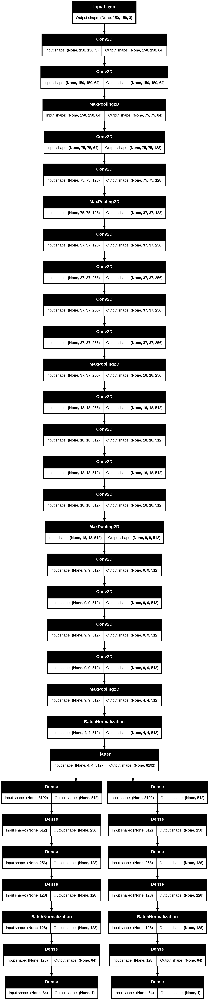

In [ ]:
from keras.utils import plot_model
plot_model(model,show_shapes=True)

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 150, 150,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 150, 150,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 75, 75,    │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 75, 75,    │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 75, 75,    │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 37, 37,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 37, 37,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 37, 37,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 37, 37,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv4        │ (None, 37, 37,    │    590,080 │ block3_conv3[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 18, 18,    │          0 │ block3_conv4[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 18, 18,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 18, 18,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 18, 18,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv4        │ (None, 18, 18,    │  2,359,808 │ block4_conv3[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 9, 9, 512) │          0 │ block4_conv4[0][

 Total params: 28,795,202 (109.84 MB)

 Trainable params: 18,208,514 (69.46 MB)

 Non-trainable params: 10,586,688 (40.39 MB)

In [ ]:
# COMPILE THE MODEL
model.compile(
    optimizer='adam',
    loss={
        'age': 'mae',             # or use model.output_names[0]
        'gender': 'binary_crossentropy'
    },
    metrics={
        'age': 'mae',
        'gender': 'accuracy'
    },
    loss_weights={'age': 1.0, 'gender': 40.0}
)

In [ ]:
# ENABLE EARLY STOPPING
early_stop = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    min_delta=0.001,
    mode='min',
    restore_best_weights=True
)

In [ ]:
# TRAIN THE MODEL
history = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen_base),
    validation_data=test_gen,
    validation_steps=len(test_gen_base),
    epochs=30,
    callbacks=early_stop

)

Epoch 1/30
556/556 ━━━━━━━━━━━━━━━━━━━━ 182s 300ms/step - age_loss: 18.5372 - age_mae: 18.5372 - gender_accuracy: 0.6561 - gender_loss: 0.6051 - loss: 42.7408 - val_age_loss: 18.5858 - val_age_mae: 18.6373 - val_gender_accuracy: 0.5769 - val_gender_loss: 1.4706 - val_loss: 77.3194
Epoch 2/30
556/556 ━━━━━━━━━━━━━━━━━━━━ 198s 357ms/step - age_loss: 10.0715 - age_mae: 10.0715 - gender_accuracy: 0.8329 - gender_loss: 0.3718 - loss: 24.9437 - val_age_loss: 12.8890 - val_age_mae: 12.8890 - val_gender_accuracy: 0.8809 - val_gender_loss: 0.2673 - val_loss: 23.5803
Epoch 3/30
556/556 ━━━━━━━━━━━━━━━━━━━━ 152s 274ms/step - age_loss: 8.9843 - age_mae: 8.9843 - gender_accuracy: 0.8589 - gender_loss: 0.3129 - loss: 21.4994 - val_age_loss: 11.0024 - val_age_mae: 11.0024 - val_gender_accuracy: 0.8635 - val_gender_loss: 0.3191 - val_loss: 23.7653
Epoch 4/30
556/556 ━━━━━━━━━━━━━━━━━━━━ 151s 272ms/step - age_loss: 8.3751 - age_mae: 8.3751 - gender_accuracy: 0.8738 - gender_loss: 0.2868 - loss: 19.8452

In [ ]:
#age_loss: 6.0996 - age_mae: 6.0996 - gender_accuracy: 0.9292 - gender_loss: 0.1734 - loss: 16.5035 - val_age_loss: 6.3405 - val_age_mae: 6.1923 - val_gender_accuracy: 0.9152 - val_gender_loss: 0.2154 - val_loss: 18.9265
model.save('/content/drive/MyDrive/final_model.keras')

In [ ]:
#age_loss: 5.6160 - age_mae: 5.6159 - gender_accuracy: 0.9447 - gender_loss: 0.1365 - loss: 11.0763 - val_age_loss: 5.9452 - val_age_mae: 5.6411 - val_gender_accuracy: 0.9360 - val_gender_loss: 0.1645 - val_loss: 12.5225
model.save('/content/drive/MyDrive/best_model512_0.keras')

In [ ]:
#age_loss: 6.4429 - age_mae: 6.4429 - gender_accuracy: 0.9152 - gender_loss: 0.1978 - loss: 14.3549 - val_age_loss: 5.8023 - val_age_mae: 5.8051 - val_gender_accuracy: 0.9203 - val_gender_loss: 0.2020 - val_loss: 13.9181
model.save('/content/drive/MyDrive/final_model.keras')

<ipython-input-33-22be4e1fbc32>:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


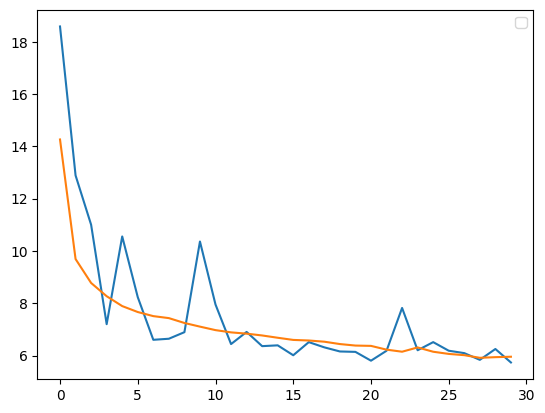

In [ ]:
# AGE LOSS
plt.plot(history.history['val_age_loss'])
plt.plot(history.history['age_loss'])
plt.legend()
plt.show()

<ipython-input-34-23202eb07bf6>:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


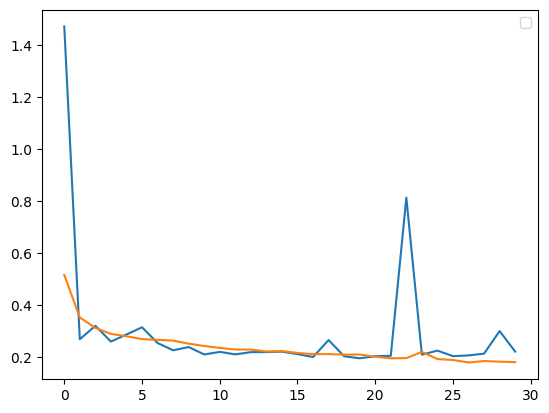

In [ ]:
# GENDER LOSS
plt.plot(history.history['val_gender_loss'])
plt.plot(history.history['gender_loss'])
plt.legend()

<ipython-input-35-63a12dbc5bbd>:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


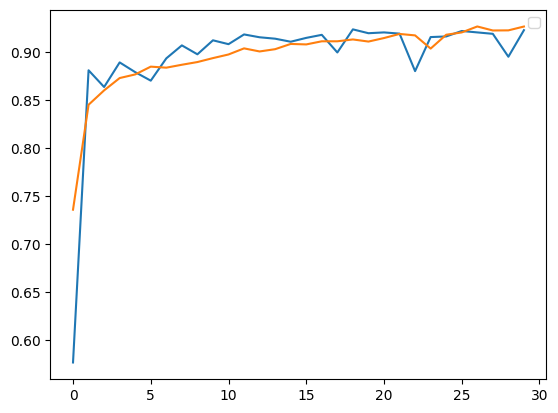

In [ ]:
# GENDER LOSS ACCURACY
plt.plot(history.history['val_gender_accuracy'])
plt.plot(history.history['gender_accuracy'])
plt.legend()

# TEST THE MODEL ON VALIDATION DATA

In [21]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/final_model.keras')

In [37]:
count = 0
mae = 0
accuracy = 0
for batch in val_gen:
  count+=1
  imgs = batch[0]
  age = batch[1]['age']
  gender = batch[1]['gender']
  age_pred , gender_pred = model.predict(imgs)
  mae += abs(age - age_pred.ravel()).mean()
  gender_pred = gender_pred.ravel()
  accuracy += abs(gender - np.where(gender_pred>0.5,1,0)).sum()/len(gender)

  if count==38:
    break

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 

In [38]:
print("Mean Absolute Error : ",mae/38)
print("Accuracy Score : ",1-accuracy/38)

Mean Absolute Error :  5.7117753
Accuracy Score :  0.90625


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

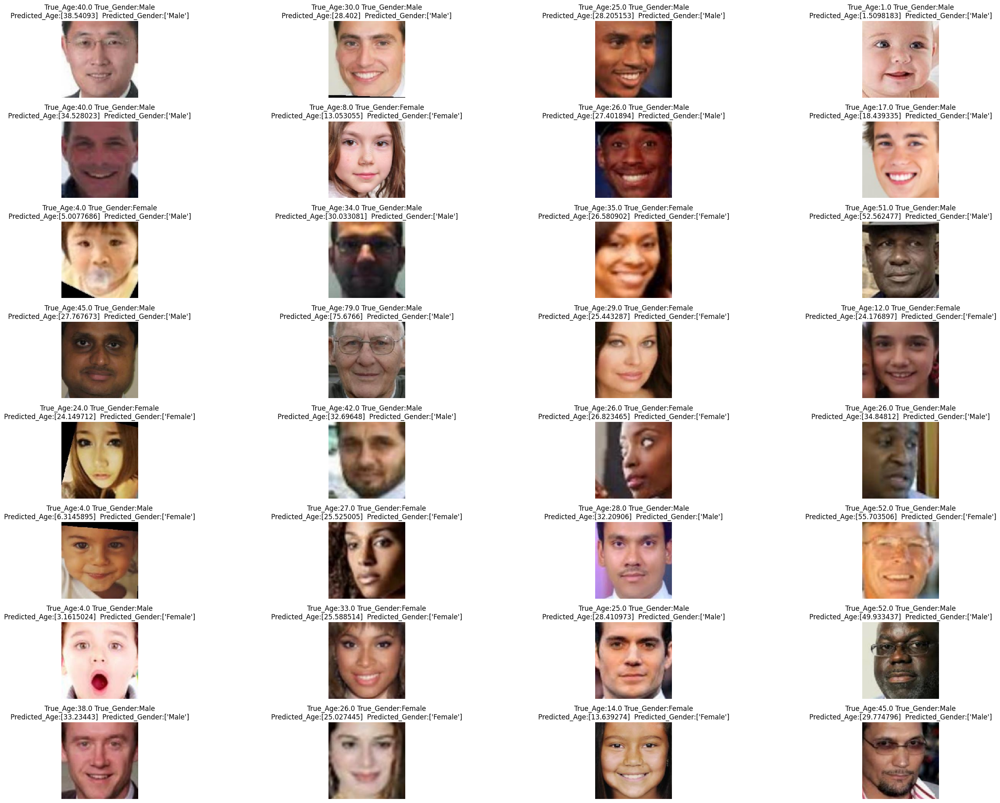

In [36]:
plt.figure(figsize=(30,20))
count = 0
for batch in val_gen:
  if count==1:
    break
  imgs = batch[0]
  ages = batch[1]['age']
  genders = batch[1]['gender']
  for i in range(32):
    img = np.expand_dims(imgs[i], axis=0)
    age_pred,gender_pred  = model.predict(img)
    gender_pred = np.where(gender_pred>0.5,'Female','Male').ravel()
    age_true = ages[i]
    gender_true = genders[i]
    if gender_true==0:
      gender_true = "Male"
    else:
      gender_true = 'Female'
    plt.subplot(8,4,i+1)
    plt.imshow(img[0])
    plt.title(f"True_Age:{age_true} True_Gender:{gender_true}\nPredicted_Age:{age_pred.ravel()}  Predicted_Gender:{gender_pred.ravel()}")
    plt.axis('off')
  count += 1
plt.tight_layout()
plt.show()

# At this point, our mean absolute error on the validation data is 5.80, and the accuracy on the validation data is above 90%